# TC1- MACHINE LEARNING: CLASIFICACION DE FLORES
## Cuaderno 2: Implementación de Redes Neuronales

#### Integrantes del Grupo Nº1
| NOMBRES Y APELLIDOS | CODIGO |ROL|
|:----------|----------|:----------|
| Ortiz Abanto Kevin Miguel| 20200230 | Integrante|
| Pachas Lopez Nabia Jazmin| 20200231 | Integrante| 
| Retuerto Santillan Mauro Alejandro| 20200202 | Coordinador|

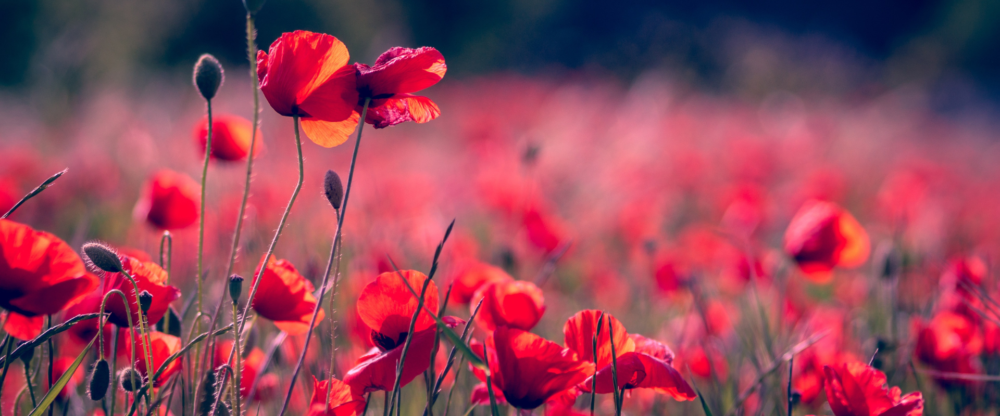

In [1]:
from IPython.display import Image
i = Image(filename='img_portadas\\flores.png')
i

## 1.BIBLIOTECAS UTILIZADAS

In [2]:
# Bibliotecas base
import os 
import keras
import numpy as np 
import pandas as pd
import tensorflow as tf
from IPython.display import clear_output as cls

# Bibliotecas para el procesamiento de imagenes
from keras.preprocessing.image import ImageDataGenerator

# Bibliotecas para la visualizacion
import plotly.express as px
import matplotlib.pyplot as plt

# Bibliotecas para el modelo 
from keras.models import Sequential, load_model
from keras.layers import GlobalAvgPool2D as GAP, Dense, Dropout

# Callbacks 
from keras.callbacks import EarlyStopping, ModelCheckpoint

# Bibliotecas con modelos pre entrenados
from tensorflow.keras.applications import ResNet50, ResNet50V2, InceptionV3, Xception, ResNet152, ResNet152V2

## 1.EXPLORACION DE LA DATA
### Definicion de las Clases
Lo primero que se realiza es la definición de la ruta del directorio donde se encuentran las imágenes de entrenamiento. A partir de ello, se obtiene una lista de los nombres de las clases de flores presentes en el directorio especificado, para esto se hace uso de `os.listdir()`.Y después se calcula el número de clases de flores contando la cantidad de elementos en la lista.

In [3]:
directorio = 'img_flores/Entrenamiento_Data/'
nombres_clases = sorted(os.listdir(directorio))
n_clases = len(nombres_clases)

print(f"Numero de clases : {n_clases} \nNombre de las clases : {nombres_clases}")

Numero de clases : 5 
Nombre de las clases : ['Girasoles', 'Lavandas', 'Lirios', 'Margaritas', 'Rosas']


### Datos para Entrenamiento

Posteriormente, se crea una lista llamada `frecuencia_clases` que contiene el número de imágenes en cada clase de flores. Cada elemento de la lista representa la frecuencia o cantidad de imágenes presentes en el directorio correspondiente a una clase de flores específica.

In [4]:
frecuencia_clases = [len(os.listdir(directorio + nombre)) for nombre in nombres_clases]

Se realiza un grafico circular y de barras respectivamente para ver la proporción de los datos:

In [5]:
colores = ["#FFDE59", "#BD94E4", "#6C47C4", "#FFBD59", "#FF5757"]  
fig = px.pie(names=nombres_clases, values=frecuencia_clases, title="Datos para Entrenamiento agrupados por clase", hole=0.4,color_discrete_sequence=colores)
fig.update_layout({'title':{'x':0.5}})
fig.show()

In [6]:
fig = px.bar(x=nombres_clases, y=frecuencia_clases, title="Datos para Entrenamiento agrupados por clase", color=nombres_clases,color_discrete_sequence=colores)
fig.update_layout({'title':{'x':0.5}})
fig.show()

### Datos para Validacion

De la misma manera que para los datos de entrenamiento, se define la ruta del directorio donde se encuentran las imágenes de validacion. A partir de ello, se obtiene una lista de los nombres de las clases de flores presentes en el directorio especificado, para esto se hace uso de `os.listdir()`.Después se calcula el número de clases de flores contando la cantidad de elementos en la lista.

In [7]:
directorio_val = 'img_flores/Validacion_Data/'
frecuencia_clases_val = [len(os.listdir(directorio_val + nombre)) for nombre in nombres_clases]

fig = px.bar(x=nombres_clases, y=frecuencia_clases_val, title="Datos para Validacion agrupados por clase", color=nombres_clases, 
             color_discrete_sequence=colores)
fig.update_layout({'title':{'x':0.5}})
fig.show()


Y finalmente se realiza el mismo proceso para los datos de Testeo:

In [8]:
directorio_testeo = 'img_flores/Testeo_Data/'

frecuencia_clases_test= [len(os.listdir(directorio_testeo + nombre)) for nombre in nombres_clases]

fig = px.bar(x=nombres_clases, y=frecuencia_clases_test, title="Datos para Testeo agrupados por clase", color=nombres_clases,
             color_discrete_sequence=colores)
fig.update_layout({'title':{'x':0.5}})
fig.show()

## 2.EXTRACCION DE LAS IMAGENES

Se inicializan generadores de imágenes para el entrenamiento (`entr_gen`), validación (`val_gen`), y prueba (`test_gen`). Con estos generadores se crean flujod de datos desde los directorio especificados. Las imágenes en cada uno de los directorios se escalan mediante `rescale=1/255.`, se aplican rotaciones aleatorias en un rango de 10 grados (`rotation_range=10`), y se realiza un giro horizontal (`horizontal_flip=True`).
Como se puede apreciar, se están utilizando un total de 500 imagenes para entrenamiento, 2500 para validación y 958 para testeo.

In [9]:
# Inicializacion de Generadores
entr_gen = ImageDataGenerator(rescale=1/255., rotation_range=10, horizontal_flip=True)
val_gen = ImageDataGenerator(rescale=1/255.)
test_gen = ImageDataGenerator(rescale=1/255)

# Extraccion de la data de entrenamiento, validacion y testeo
entr_ds = entr_gen.flow_from_directory(directorio, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32) 
val_ds = val_gen.flow_from_directory(directorio_val, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32) 
test_ds = test_gen.flow_from_directory(directorio_testeo, class_mode='binary', target_size=(256,256), shuffle=True, batch_size=32)

Found 5000 images belonging to 5 classes.
Found 2500 images belonging to 5 classes.
Found 958 images belonging to 5 classes.


Asimismo, se define una función llamada `mostrar_imagenes`, cuyo parametros son:
- `GRID`: Es una lista que especifica el tamaño de la cuadrícula de las imágenes a mostrar. GRID[0] es el número de filas y GRID[1] es el número de columnas. 

- `Model`: Es un modelo de clasificación (por ejemplo, un modelo entrenado).

- `size`: Es una tupla que especifica el tamaño de la figura que contiene la cuadrícula de imágenes.

- `data`: Es el conjunto de datos desde el cual se obtendrán las imágenes y etiquetas para mostrar.

In [10]:
def mostrar_imagenes(GRID=[5,5], model=None, size=(20,20), data=entr_ds):
    n_filas = GRID[0]
    n_columnas = GRID[1]
    n_imagenes = n_columnas * n_filas
    
    i = 1
    plt.figure(figsize=size)
    for imagenes, etiquetas in data:
        id = np.random.randint(len(imagenes))
        img, eti = imagenes[id], nombres_clases[int(etiquetas[id])]
        
        plt.subplot(n_filas, n_columnas, i)
        plt.imshow(img)
        
        if model is None:
            title = f"Class : {eti}"
        else:
            pred = nombres_clases[int(np.argmax(model.predict(img[np.newaxis, ...])))]
            title = f"Org : {eti}, Pred : {pred}"
            cls()
        
        plt.title(title)
        plt.axis('off')
        
        i+=1
        if i>=(n_imagenes+1):
            break
            
    plt.tight_layout()
    plt.show()

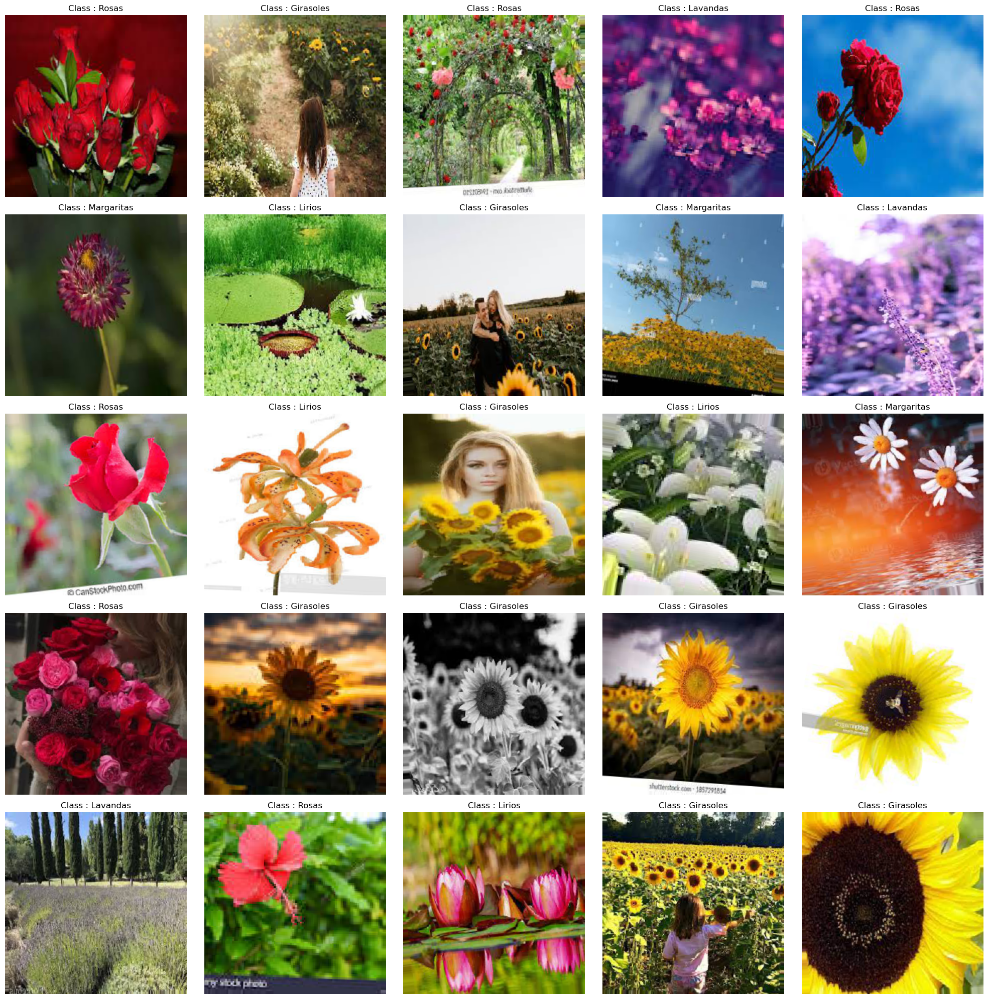

In [11]:
mostrar_imagenes()

## 3.CONSTRUCCION DEL MODELO
### Modelo 1

- **Modelo Preentrenado**

Se está utilizando la arquitectura de la red neuronal convolucional ResNet50V2 como modelo base para construir un modelo de aprendizaje profundo personalizado.

- Lo primero que se realiza es crear una instancia de la arquitectura de la red neuronal convolucional ResNet50V2. El parámetro `input_shape=(256,256,3)` especifica las dimensiones de entrada de las imágenes, que son de 256 píxeles de ancho, 256 píxeles de alto y 3 canales de color (RGB). 


- Asimismo, el parámetro `include_top=False` indica que no se incluirá la capa completamente conectada (fully connected) en la parte superior de la red, lo que implica que el modelo se utilizará como una base para construir un modelo personalizado en lugar de utilizarlo directamente para clasificación.


- Además, se establece `base_modelo.trainable = False`, lo cual nos permite ***congelar*** los pesos de la red neuronal convolucional ResNet50V2. Esto significa que los pesos pre-entrenados no se actualizarán durante el proceso de entrenamiento de este nuevo modelo personalizado. Al establecer `trainable = False`, se evita que los gradientes se propaguen a través de las capas de la red base durante el entrenamiento, lo que permite utilizar las características aprendidas anteriormente por la ResNet50V2 sin modificarlas.

In [13]:
base_modelo = ResNet50V2(input_shape=(256,256,3), include_top=False)
base_modelo.trainable = False

- **Arquitectura**

Despues de haber obtenido el modelo base, se comienza a construir la arquitectura de la red neuronal personaliza
- Se define el nombre del modelo, en este caso "ResNet50V2_1072023". Se crea una instancia de Sequential, que es la forma más básica de construir un modelo en Keras. Este modelo secuencial se compone de varias capas que se apilan una encima de la otra.


- La primera capa que se agrega al modelo es `base_modelo`, que es la instancia de la arquitectura ResNet50V2 creada anteriormente. Esto establece la ResNet50V2 como la primera capa del modelo personalizado.


- A continuación, se agrega una capa GAP() que representa la operación de Global Average Pooling (promedio global). Esta capa reduce la salida de la ResNet50V2 a una representación unidimensional.


- Se agrega una capa completamente conectada (Dense) con 256 neuronas, función de activación ReLU y una inicialización de pesos 'he_normal'. Esta capa se encarga de aprender características más abstractas a partir de las características extraídas por la ResNet50V2.


- Asimismo, se agrega una capa de salida Dense con `n_clases` neuronas y una función de activación softmax. Esta capa produce la salida final del modelo, que es una distribución de probabilidad sobre las clases diferentes del problema.

In [14]:
nombre = "ResNet50V2_1072023"
modelo = Sequential([
    base_modelo,
    GAP(),
    Dense(256, activation='relu', kernel_initializer='he_normal'),
    Dense(n_clases, activation='softmax')
], name=nombre)

- **Entenamiento**

Con la arquitectura completamente lista, se pasa a definir los callbacks y se procede con la compilacion y entrenamiento del modelo.
Por una parte, primero se definen dos callbacks para ser utilizados durante el entrenamiento del modelo:
- `EarlyStopping`: detiene el entrenamiento si no se observa una mejora en la métrica monitoreada (en este caso, la pérdida) durante un número de épocas determinado (`patience`). El modelo se restaura a los pesos que tuvieron el mejor desempeño en términos de la métrica monitoreada.
- `ModelCheckpoint`: guarda el modelo con los mejores pesos en un archivo .h5 durante el entrenamiento. 
- Se compila el modelo utilizando la función de pérdida 'sparse_categorical_crossentropy', el optimizador 'adam' y la métrica 'accuracy'. Esto establece la configuración necesaria para el proceso de entrenamiento.
- Se entrena el modelo utilizando el método `fit()`. Se proporciona el conjunto de entrenamiento (`entr_ds`) y el conjunto de validación (`val_ds`). También se especifican los callbacks definidos anteriormente. El entrenamiento se realiza durante un número determinado de épocas (`epochs`), que en este caso es de 50.

In [14]:
# Callbacks
cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(nombre + ".h5", save_best_only=True)]

# Compilacion
modelo.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrenamiento
historico = modelo.fit(entr_ds, validation_data=val_ds, callbacks=cbs, epochs=50)

Epoch 1/50
157/157 [==============================] - 707s 4s/step - loss: 0.3990 - accuracy: 0.8650 - val_loss: 0.2793 - val_accuracy: 0.9076
Epoch 2/50
157/157 [==============================] - 614s 4s/step - loss: 0.2095 - accuracy: 0.9304 - val_loss: 0.2593 - val_accuracy: 0.9092
Epoch 3/50
157/157 [==============================] - 635s 4s/step - loss: 0.1229 - accuracy: 0.9620 - val_loss: 0.3166 - val_accuracy: 0.8976
Epoch 4/50
157/157 [==============================] - 610s 4s/step - loss: 0.1027 - accuracy: 0.9680 - val_loss: 0.2660 - val_accuracy: 0.9180
Epoch 5/50
157/157 [==============================] - 422s 3s/step - loss: 0.0731 - accuracy: 0.9762 - val_loss: 0.2439 - val_accuracy: 0.9240
Epoch 6/50
157/157 [==============================] - 340s 2s/step - loss: 0.0700 - accuracy: 0.9748 - val_loss: 0.2502 - val_accuracy: 0.9200
Epoch 7/50
157/157 [==============================] - 333s 2s/step - loss: 0.0469 - accuracy: 0.9860 - val_loss: 0.2449 - val_accuracy: 0.9264

### Modelo 2
Se establece otro modelo con una arquitetura diferente. En esta nueva versión se agrega la instruccion `Dropout(0.4)`. Esta es una capa de Dropout con una tasa de abandono del 40%. Dicha capa ayuda a regularizar el modelo y reduce el sobreajuste al desactivar aleatoriamente algunas neuronas durante el entrenamiento.
Además, se debe mencionar que la cantidad de neuronas fue reducida a 128.
- **Modelo Preentrenado**

In [15]:
base_modelo = ResNet50V2(input_shape=(256,256,3), include_top=False)
base_modelo.trainable = False

- **Arquitectura**

In [16]:
nombre = "ResNet50V2_1072023_v2"
modelo = Sequential([
    base_modelo,
    GAP(),
    Dense(128, activation='relu', kernel_initializer='he_normal'),
    Dropout(0.4),
    Dense(n_clases, activation='softmax')
], name=nombre)

- **Entrenamiento**

In [17]:
# Callbacks
cbs = [EarlyStopping(patience=3, restore_best_weights=True), ModelCheckpoint(nombre + ".h5", save_best_only=True)]

# Compilacion
modelo.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

# Entrenamiento
historico = modelo.fit(entr_ds, validation_data=val_ds, callbacks=cbs, epochs=50)

Epoch 1/50
157/157 [==============================] - 306s 2s/step - loss: 0.5478 - accuracy: 0.8034 - val_loss: 0.3077 - val_accuracy: 0.8960
Epoch 2/50
157/157 [==============================] - 325s 2s/step - loss: 0.2918 - accuracy: 0.8990 - val_loss: 0.2557 - val_accuracy: 0.9152
Epoch 3/50
157/157 [==============================] - 314s 2s/step - loss: 0.2265 - accuracy: 0.9214 - val_loss: 0.2731 - val_accuracy: 0.9084
Epoch 4/50
157/157 [==============================] - 308s 2s/step - loss: 0.1876 - accuracy: 0.9348 - val_loss: 0.2282 - val_accuracy: 0.9272
Epoch 5/50
157/157 [==============================] - 336s 2s/step - loss: 0.1644 - accuracy: 0.9442 - val_loss: 0.2624 - val_accuracy: 0.9204
Epoch 6/50
157/157 [==============================] - 310s 2s/step - loss: 0.1359 - accuracy: 0.9540 - val_loss: 0.2559 - val_accuracy: 0.9128
Epoch 7/50
157/157 [==============================] - 318s 2s/step - loss: 0.1261 - accuracy: 0.9550 - val_loss: 0.2144 - val_accuracy: 0.9336

## 4. EVALUACION DEL MODELO

In [18]:
data = pd.DataFrame(historico.history)

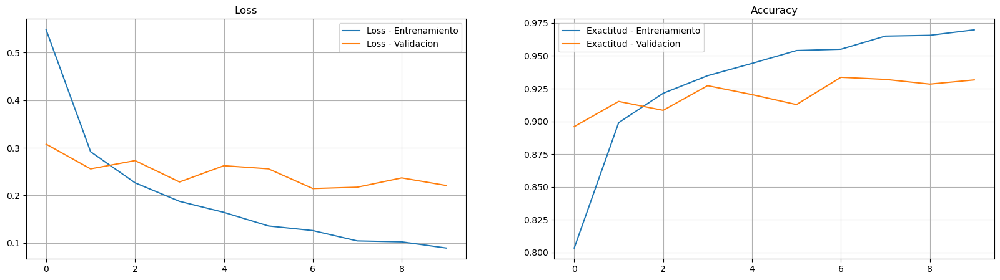

In [19]:
plt.figure(figsize=(20,5))

plt.subplot(1,2,1)
plt.plot(data.loss, label='Loss - Entrenamiento')
plt.plot(data.val_loss, label='Loss - Validacion')
plt.title("Loss")
plt.grid()
plt.legend()

plt.subplot(1,2,2)
plt.plot(data.accuracy, label='Exactitud - Entrenamiento')
plt.plot(data.val_accuracy, label='Exactitud - Validacion')
plt.title("Accuracy")
plt.grid()
plt.legend()

plt.show()

Comose observó en el apartado anterior, la version 2 del modelo contruido logro mejorar la exactitud obtenida, por tal motivo enfocaremos nuestro analisis sobre dicho modelo:

Como se observó en la grafica anterior, el valor de pérdida fue bastante bajo, lo que indica que el modelo logró una buena capacidad de ajuste a los datos de entrenamiento. Asimismo, la precisión del modelo en la clasificación de las flores tuvo un valor de 0.9700, lo que significa que el modelo ha clasificado correctamente el 97% de las imágenes de entrenamiento.

Por otra parte, la función de pérdida obtenida durante la evaluación del modelo en el conjunto de validación fue de 0.2442. Similar al valor de pérdida anterior, cabe mencionar que cuanto más bajo sea el valor de pérdida en el conjunto de validación, mejor será el rendimiento general del modelo.

Asimismo, la precisión del modelo en la clasificación de las flores sobre el conjunto de validación alcanzó el valor de 0.9280, lo que significa que el modelo logró clasificar  correctamente el 92.8% de las imágenes en el conjunto de validación.

Por todo ello, estos resultados indican que el modelo ha obtenido un buen rendimiento tanto en el conjunto de entrenamiento como en el conjunto de validación. La precisión alcanza el 97% en el conjunto de entrenamiento y el 92.8% en el conjunto de validación, lo que sugiere que el modelo es capaz de generalizar bien a datos no vistos previamente.

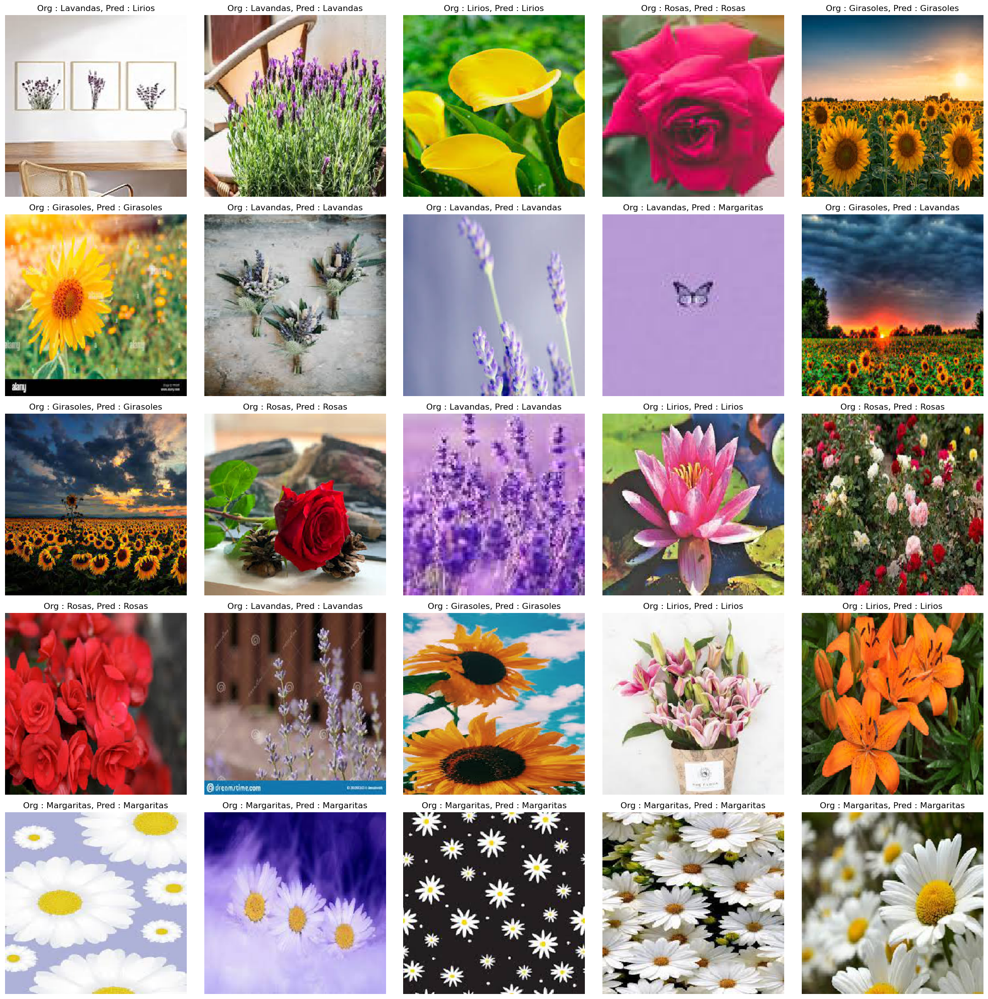

In [20]:
# Predicciones
mostrar_imagenes(model=modelo, data=val_ds)